# Launch pad

In [1]:
! nvidia-smi

Sat May 13 09:45:29 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 510.47.03    Driver Version: 510.47.03    CUDA Version: 11.6     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   74C    P8    22W /  70W |      0MiB / 15360MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
|   1  Tesla T4            Off  | 00000000:00:05.0 Off |                    0 |
| N/A   

# First

siren_init__initc=6__flic=1__nh=3__h=256__baseline
Setting seed to 0


Failed to detect the name of this notebook, you can set it manually with the WANDB_NOTEBOOK_NAME environment variable to enable code saving.
wandb: Currently logged in as: kilianovski. Use `wandb login --relogin` to force relogin


********************************************************************************


image: tokyo512.png
image_dir: ../../data
image_W: 512
use_wandb: true
is_debug: false
total_steps: 3000
random_seed:
- 0
- 1
model:
  _target_: spellbook.siren.model.Siren
  in_features: 2
  out_features: none
  hidden_features: 256
  hidden_layers: 3
  init_c: 6
  first_layer_init_c: 1
  outermost_linear: true
logging:
  logger:
    _target_: spellbook.logging.wandb.WandbLogger
    project: 01_splitnet__${image}
  steps_till_summary: 500
  experiment_name: siren_init__initc=6__flic=1__nh=3__h=256__baseline
optimizer:
  _target_: torch.optim.AdamW
  weight_decay: 0.0
  lr: 0.0001
device: cuda:1


********************************************************************************
+---------------------+------------+
|       Modules       | Parameters |
+---------------------+------------+
| net.0.linear.weight |    512     |
|  net.0.linear.bias  |    256     |
| net.1.linear.weight |   65536    |
|  net.1.

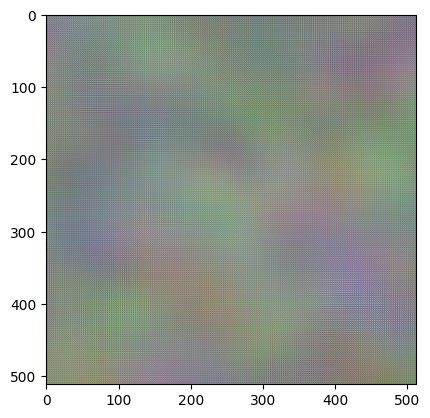

Step 500, Total loss 0.010929


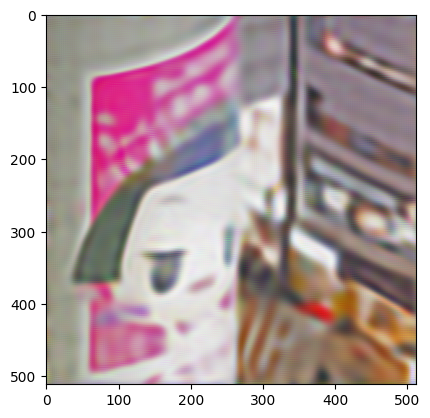

Step 1000, Total loss 0.006993


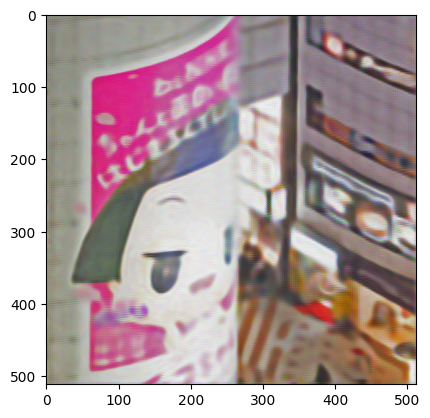

Step 1500, Total loss 0.005463


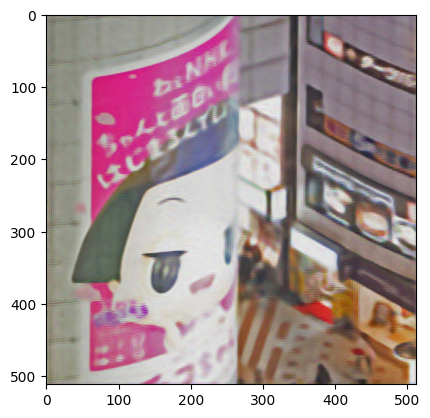

Step 2000, Total loss 0.004483


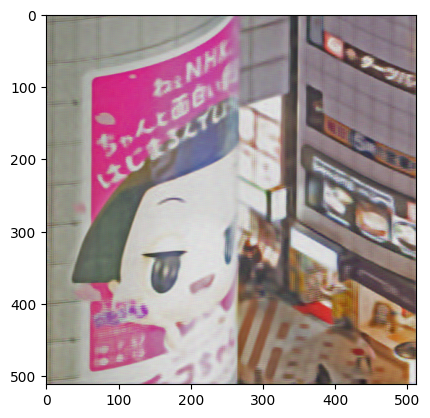

Step 2500, Total loss 0.003762


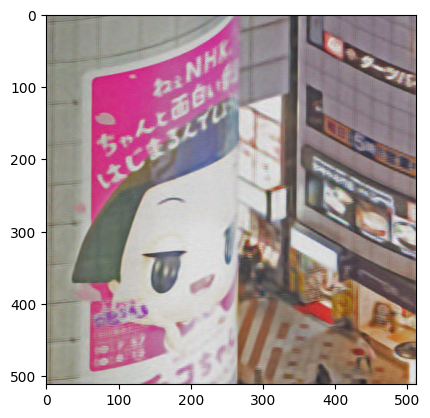

Setting seed to 1


mse,█▅▅▄▄▃▃▃▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
psnr,▁▂▃▃▃▄▄▅▅▅▅▅▆▆▆▆▆▆▆▆▇▇▇▇▇▇▇▇▇▇▇▇████████
step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
total_params,▁
step,2999
total_params,198915


********************************************************************************


image: tokyo512.png
image_dir: ../../data
image_W: 512
use_wandb: true
is_debug: false
total_steps: 3000
random_seed:
- 0
- 1
model:
  _target_: spellbook.siren.model.Siren
  in_features: 2
  out_features: none
  hidden_features: 256
  hidden_layers: 3
  init_c: 6
  first_layer_init_c: 1
  outermost_linear: true
logging:
  logger:
    _target_: spellbook.logging.wandb.WandbLogger
    project: 01_splitnet__${image}
  steps_till_summary: 500
  experiment_name: siren_init__initc=6__flic=1__nh=3__h=256__baseline
optimizer:
  _target_: torch.optim.AdamW
  weight_decay: 0.0
  lr: 0.0001
device: cuda:1


********************************************************************************
+---------------------+------------+
|       Modules       | Parameters |
+---------------------+------------+
| net.0.linear.weight |    512     |
|  net.0.linear.bias  |    256     |
| net.1.linear.weight |   65536    |
|  net.1.

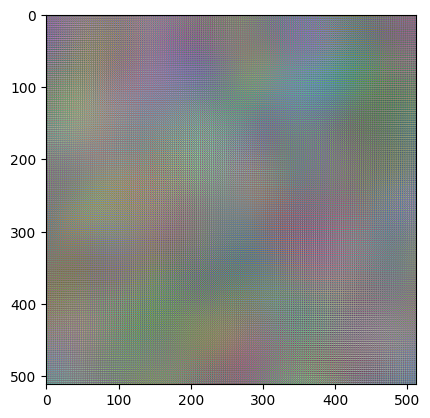

Step 500, Total loss 0.011491


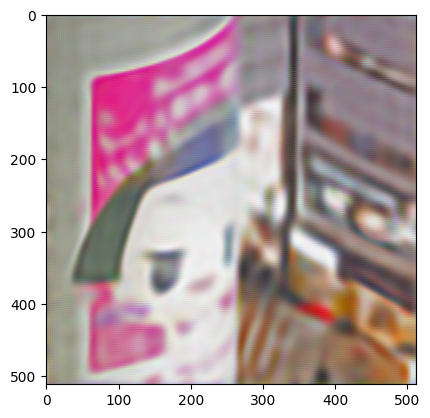

Step 1000, Total loss 0.007495


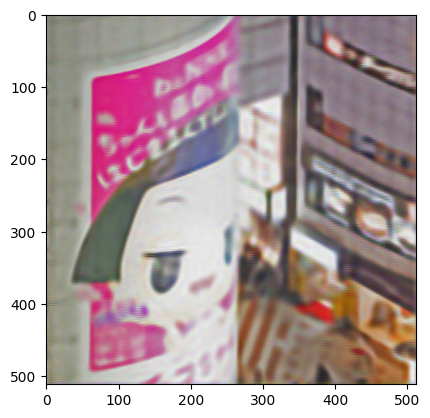

Step 1500, Total loss 0.005753


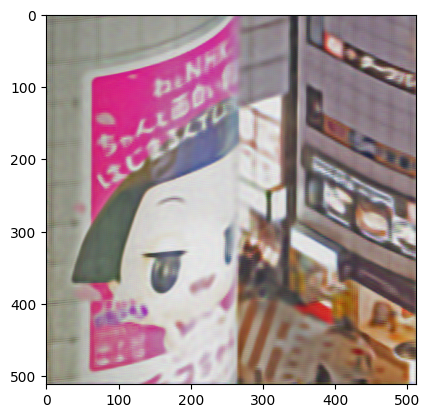

Step 2000, Total loss 0.004622


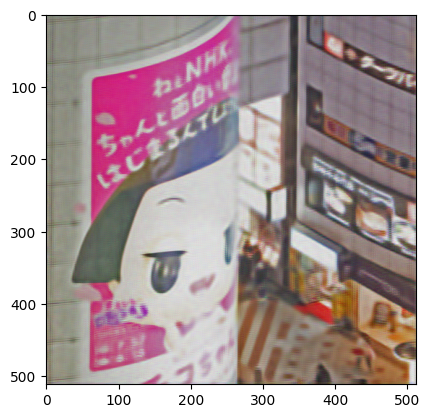

Step 2500, Total loss 0.003875


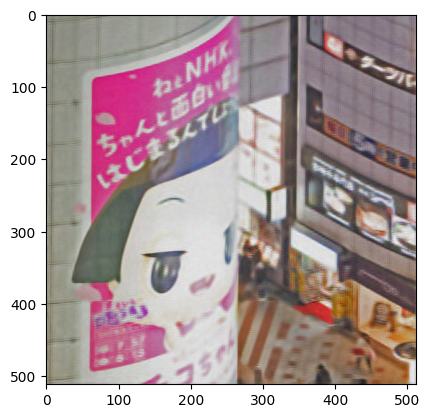

In [12]:
from train_pipeline import train

import os
import torch
from hydra import initialize, initialize_config_module, initialize_config_dir, compose
from hydra.utils import instantiate
from omegaconf import OmegaConf


def load_cfg(overrides=()):
    # with initialize_config_dir(config_dir="/app/notebooks/draft_02/conf"):
    with initialize(version_base=None, config_path="./conf"):
        cfg = compose(config_name='config', overrides=list(overrides))
        return cfg

from IPython.display import clear_output

import lovely_tensors as lt
lt.monkey_patch()

# cfg = load_cfg(overrides=[
#     "+exp=00_siren_init",
#     f"model.first_layer_init_c={1.9339}",
#     f"model.init_c={39.43}",
#     # "image=cameraman",
#     "+device=cuda:1",
# ])

cfg = load_cfg(overrides=[
    "+exp=00_siren_init",
    # f"model.first_layer_init_c={2.}",
    # f"model.init_c={40.}",
    "random_seed=[0,1]",
    'model.hidden_features=256',
    'model.hidden_layers=3',
    # "image=cameraman",
    "+device=cuda:1",
])

cfg.logging.experiment_name += '__baseline'
print(cfg.logging.experiment_name)

train(cfg)

siren_init__initc=40.0__flic=2.0__nh=3__h=256
Setting seed to 0


mse,█▅▄▄▄▃▃▃▂▂▂▂▂▂▂▂▂▂▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
psnr,▁▂▃▃▄▄▄▅▅▅▅▅▆▆▆▆▆▆▆▆▆▇▇▇▇▇▇▇▇▇▇▇████████
step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
total_params,▁
step,2999
total_params,198915


********************************************************************************


image: tokyo512.png
image_dir: ../../data
image_W: 512
use_wandb: true
is_debug: false
total_steps: 3000
random_seed:
- 0
- 1
model:
  _target_: spellbook.siren.model.Siren
  in_features: 2
  out_features: none
  hidden_features: 256
  hidden_layers: 3
  init_c: 40.0
  first_layer_init_c: 2.0
  outermost_linear: true
logging:
  logger:
    _target_: spellbook.logging.wandb.WandbLogger
    project: 01_splitnet__${image}
  steps_till_summary: 500
  experiment_name: siren_init__initc=${model.init_c}__flic=${model.first_layer_init_c}__nh=${model.hidden_layers}__h=${model.hidden_features}
optimizer:
  _target_: torch.optim.AdamW
  weight_decay: 0.0
  lr: 0.0001
device: cuda:1


********************************************************************************
+---------------------+------------+
|       Modules       | Parameters |
+---------------------+------------+
| net.0.linear.weight |    512     |
|  net

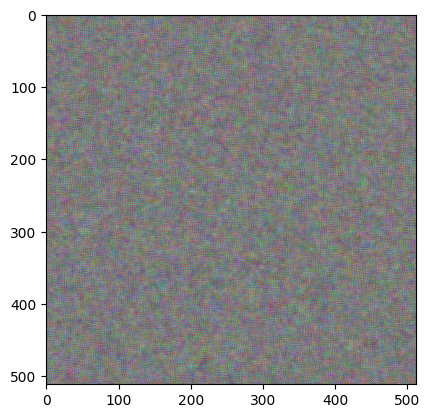

Step 500, Total loss 0.003049


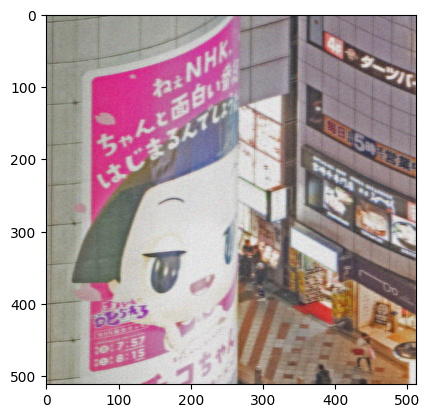

Step 1000, Total loss 0.002355


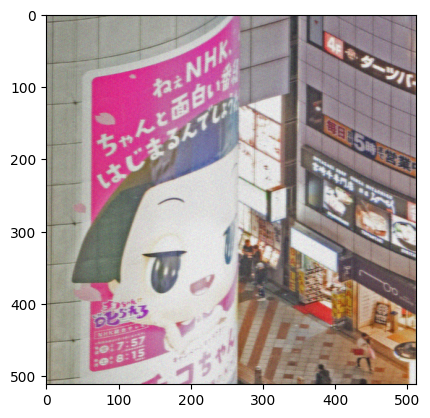

Step 1500, Total loss 0.002143


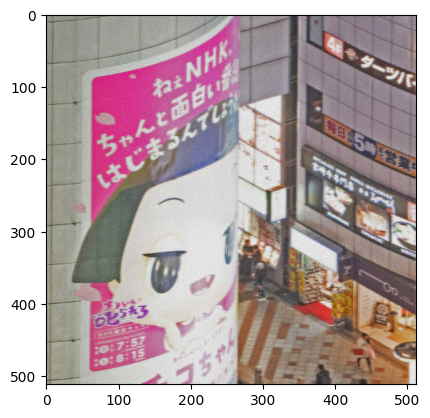

Step 2000, Total loss 0.002048


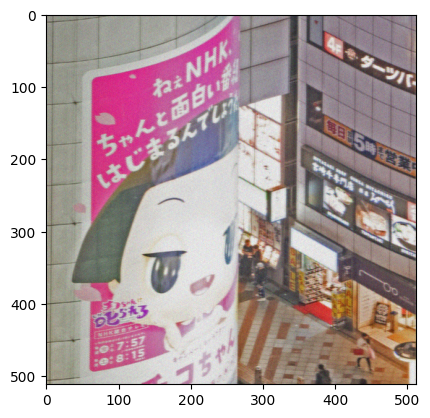

Step 2500, Total loss 0.001988


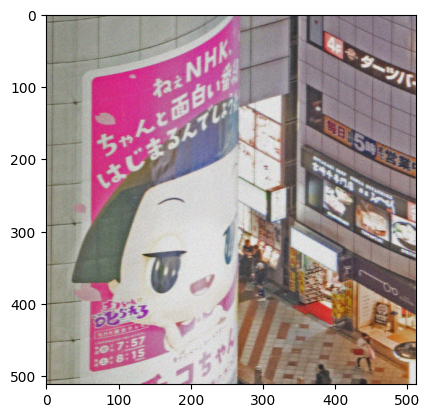

Setting seed to 1


mse,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
psnr,▁▆▆▇▇▇▇▇▇███████████████████████████████
step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
total_params,▁
step,2999
total_params,198915


********************************************************************************


image: tokyo512.png
image_dir: ../../data
image_W: 512
use_wandb: true
is_debug: false
total_steps: 3000
random_seed:
- 0
- 1
model:
  _target_: spellbook.siren.model.Siren
  in_features: 2
  out_features: none
  hidden_features: 256
  hidden_layers: 3
  init_c: 40.0
  first_layer_init_c: 2.0
  outermost_linear: true
logging:
  logger:
    _target_: spellbook.logging.wandb.WandbLogger
    project: 01_splitnet__${image}
  steps_till_summary: 500
  experiment_name: siren_init__initc=${model.init_c}__flic=${model.first_layer_init_c}__nh=${model.hidden_layers}__h=${model.hidden_features}
optimizer:
  _target_: torch.optim.AdamW
  weight_decay: 0.0
  lr: 0.0001
device: cuda:1


********************************************************************************
+---------------------+------------+
|       Modules       | Parameters |
+---------------------+------------+
| net.0.linear.weight |    512     |
|  net

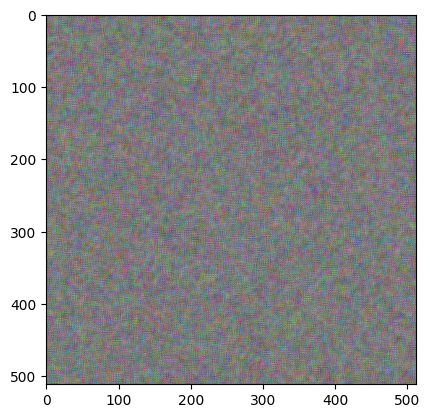

Step 500, Total loss 0.003093


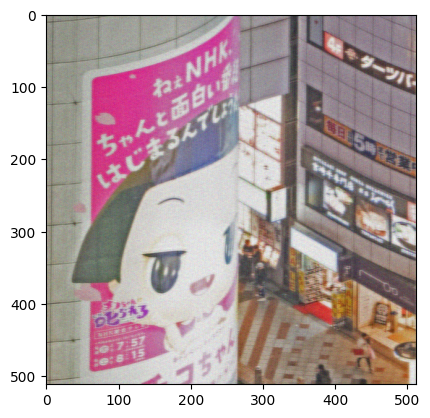

Step 1000, Total loss 0.002354


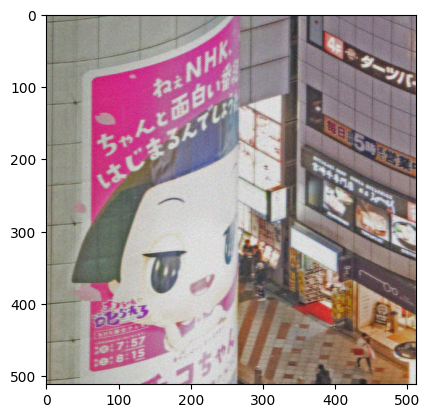

Step 1500, Total loss 0.002130


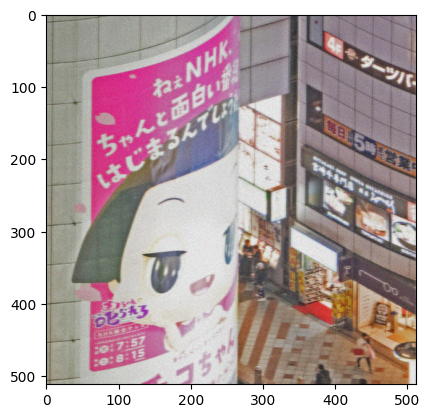

Step 2000, Total loss 0.002031


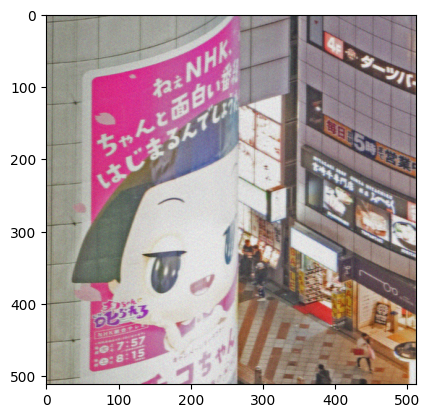

Step 2500, Total loss 0.001972


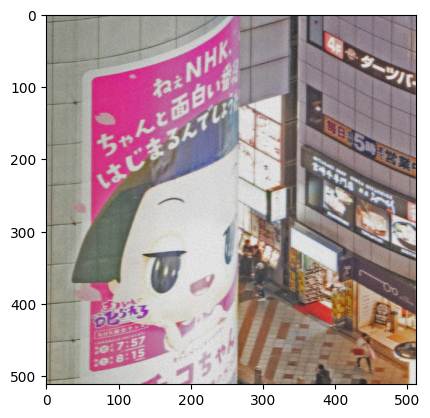

In [13]:
cfg = load_cfg(overrides=[
    "+exp=00_siren_init",
    f"model.first_layer_init_c={2.}",
    f"model.init_c={40.}",
    "random_seed=[0,1]",
    'model.hidden_features=256',
    'model.hidden_layers=3',
    # "image=cameraman",
    "+device=cuda:1",
])

# cfg.logging.experiment_name += '__baseline'
print(cfg.logging.experiment_name)

train(cfg)

# Second

siren_init__initc=6__flic=1__nh=3__h=128__baseline
Setting seed to 0


mse,█▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
psnr,▁▆▆▇▇▇▇▇▇███████████████████████████████
step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
total_params,▁
step,2999
total_params,198915


********************************************************************************


image: tokyo512.png
image_dir: ../../data
image_W: 512
use_wandb: true
is_debug: false
total_steps: 3000
random_seed:
- 0
- 1
model:
  _target_: spellbook.siren.model.Siren
  in_features: 2
  out_features: none
  hidden_features: 128
  hidden_layers: 3
  init_c: 6
  first_layer_init_c: 1
  outermost_linear: true
logging:
  logger:
    _target_: spellbook.logging.wandb.WandbLogger
    project: 01_splitnet__${image}
  steps_till_summary: 500
  experiment_name: siren_init__initc=6__flic=1__nh=3__h=128__baseline
optimizer:
  _target_: torch.optim.AdamW
  weight_decay: 0.0
  lr: 0.0001
device: cuda:1


********************************************************************************
+---------------------+------------+
|       Modules       | Parameters |
+---------------------+------------+
| net.0.linear.weight |    256     |
|  net.0.linear.bias  |    128     |
| net.1.linear.weight |   16384    |
|  net.1.

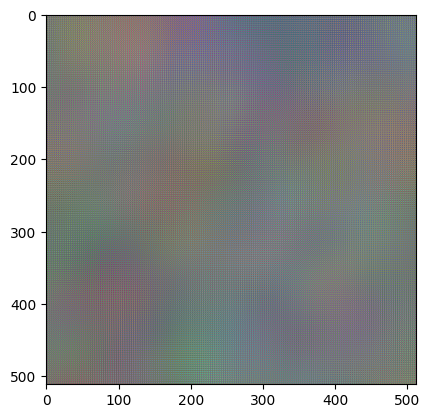

Step 500, Total loss 0.014790


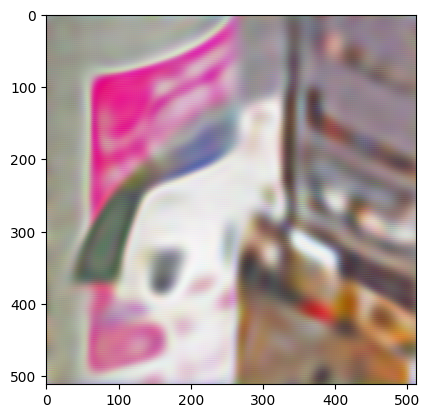

Step 1000, Total loss 0.010018


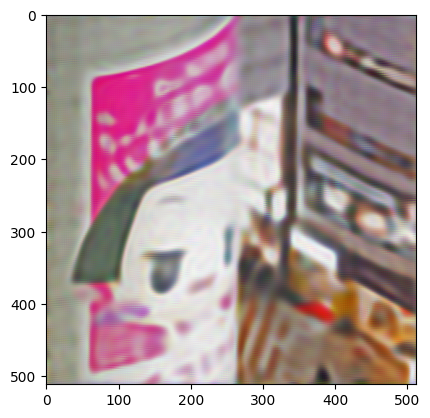

In [ ]:
cfg = load_cfg(overrides=[
    "+exp=00_siren_init",
    # f"model.first_layer_init_c={2.}",
    # f"model.init_c={40.}",
    "random_seed=[0,1]",
    'model.hidden_features=128',
    'model.hidden_layers=3',
    # "image=cameraman",
    "+device=cuda:1",
])

cfg.logging.experiment_name += '__baseline'
print(cfg.logging.experiment_name)

train(cfg)

In [ ]:
cfg = load_cfg(overrides=[
    "+exp=00_siren_init",
    f"model.first_layer_init_c={2.}",
    f"model.init_c={40.}",
    "random_seed=[0,1]",
    'model.hidden_features=128',
    'model.hidden_layers=3',
    # "image=cameraman",
    "+device=cuda:1",
])

# cfg.logging.experiment_name += '__baseline'
print(cfg.logging.experiment_name)

train(cfg)

# Third

In [ ]:
cfg = load_cfg(overrides=[
    "+exp=00_siren_init",
    # f"model.first_layer_init_c={2.}",
    # f"model.init_c={40.}",
    "random_seed=[0,1]",
    'model.hidden_features=512',
    'model.hidden_layers=3',
    # "image=cameraman",
    "+device=cuda:1",
])

cfg.logging.experiment_name += '__baseline'
print(cfg.logging.experiment_name)

train(cfg)

In [ ]:
cfg = load_cfg(overrides=[
    "+exp=00_siren_init",
    f"model.first_layer_init_c={2.}",
    f"model.init_c={40.}",
    "random_seed=[0,1]",
    'model.hidden_features=512',
    'model.hidden_layers=3',
    # "image=cameraman",
    "+device=cuda:1",
])

# cfg.logging.experiment_name += '__baseline'
print(cfg.logging.experiment_name)

train(cfg)

In [ ]:
break

# h=1024

siren_init__initc=6__flic=1__nh=3__h=1024__baseline
Setting seed to 0


mse,█▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁
psnr,▁▃▄▄▅▅▆▆▆▆▇▇▇▇▇▇▇████▇███▇█▇▇█████████▇█
step,▁▁▁▂▂▂▂▂▂▃▃▃▃▃▄▄▄▄▄▄▅▅▅▅▅▅▆▆▆▆▆▇▇▇▇▇▇███
total_params,▁
step,2999
total_params,791043


********************************************************************************


image: tokyo512.png
image_dir: ../../data
image_W: 512
use_wandb: true
is_debug: false
total_steps: 3000
random_seed:
- 0
- 1
model:
  _target_: spellbook.siren.model.Siren
  in_features: 2
  out_features: none
  hidden_features: 1024
  hidden_layers: 3
  init_c: 6
  first_layer_init_c: 1
  outermost_linear: true
logging:
  logger:
    _target_: spellbook.logging.wandb.WandbLogger
    project: 01_splitnet__${image}
  steps_till_summary: 500
  experiment_name: siren_init__initc=6__flic=1__nh=3__h=1024__baseline
optimizer:
  _target_: torch.optim.AdamW
  weight_decay: 0.0
  lr: 0.0001
device: cuda:1


********************************************************************************
+---------------------+------------+
|       Modules       | Parameters |
+---------------------+------------+
| net.0.linear.weight |    2048    |
|  net.0.linear.bias  |    1024    |
| net.1.linear.weight |  1048576   |
|  net.

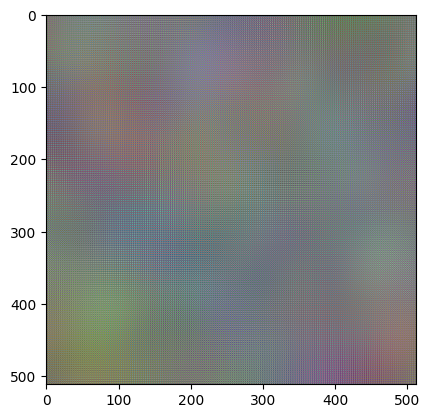

In [ ]:
cfg = load_cfg(overrides=[
    "+exp=00_siren_init",
    # f"model.first_layer_init_c={2.}",
    # f"model.init_c={40.}",
    "random_seed=[0,1]",
    'model.hidden_features=1024',
    'model.hidden_layers=3',
    # "image=cameraman",
    "+device=cuda:1",
])

cfg.logging.experiment_name += '__baseline'
print(cfg.logging.experiment_name)

train(cfg)

In [ ]:
cfg = load_cfg(overrides=[
    "+exp=00_siren_init",
    f"model.first_layer_init_c={2.}",
    f"model.init_c={40.}",
    "random_seed=[0,1]",
    'model.hidden_features=1024',
    'model.hidden_layers=3',
    # "image=cameraman",
    "+device=cuda:1",
])

# cfg.logging.experiment_name += '__baseline'
print(cfg.logging.experiment_name)

train(cfg)

# Sweep

In [ ]:
! nvidia-smi

In [ ]:
import wandb
wandb.login()
sweep_id = 'pfedvrix'

In [ ]:
from train_pipeline import train

import os
import torch
from hydra import initialize, initialize_config_module, initialize_config_dir, compose
from hydra.utils import instantiate
from omegaconf import OmegaConf


def load_cfg(overrides=()):
    # with initialize_config_dir(config_dir="/app/notebooks/draft_02/conf"):
    with initialize(version_base=None, config_path="./conf"):
        cfg = compose(config_name='config', overrides=list(overrides))
        return cfg

from IPython.display import clear_output

import lovely_tensors as lt
lt.monkey_patch()

cfg = load_cfg(overrides=[
    "+exp=06_siren_hp",
    # "model.first_layer_init_c={flic}",
    # "model.init_c={init_c}",
    "+device=cuda:1",
])

# print(OmegaConf.to_yaml(cfg))
# model, psnr = _train_seed(cfg, cfg.random_seed[0])

project_name = 'tune_siren__cameraman'

from train_pipeline import *

def _custom_train_seed(cfg, random_seed=0):
    seed_all(random_seed)
    print("Setting seed to", random_seed)

    logger = instantiate(
        cfg.logging.logger,
        project='эє',
        group=cfg.logging.experiment_name,
        name=f"rs{random_seed}",
    )
    print("*" * 80)
    print("\n")
    print(OmegaConf.to_yaml(cfg))
    print()
    print("*" * 80)

    device = cfg["device"]

    model_input, ground_truth, H, W = load_data(cfg)
    model_input, ground_truth = model_input.to(device), ground_truth.to(device)

    out_features = ground_truth.shape[-1]
    model = instantiate(cfg["model"], out_features=out_features)
    model.to(device)

    total_steps = cfg["total_steps"]
    steps_til_summary = cfg.logging["steps_till_summary"]
    batch_size = cfg.get('batch_size', None)

    optimizer = instantiate(cfg.optimizer, params=model.parameters())

    for step in range(total_steps):
        if batch_size:
            idxs = torch.randint(0, model_input.shape[1], (batch_size,))
            model_input_batch = model_input[:, idxs]
            ground_truth_batch = ground_truth[:, idxs]
        else:
            model_input_batch = model_input
            ground_truth_batch = ground_truth

        model_output_batch = model(model_input_batch)
        mse, psnr = mse_and_psnr(model_output_batch, ground_truth_batch)
        loss = mse

        log_dic = {"step": step, "mse": mse.item(), "psnr": psnr.item()}
        logger.log_dict(log_dic)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        
    return model, psnr


def _train_for_hparams():
    wandb.init(project=project_name)
    wandb_config = wandb.config
    cfg = load_cfg(overrides=[
        "+exp=06_siren_hp",
        # "total_steps=12",
        f"model.first_layer_init_c={wandb_config.flic}",
        f"model.init_c={wandb_config.initc}",
        "+device=cuda:1",
    ])
    
    print(cfg.logging.experiment_name)

    model, last_psnr = _custom_train_seed(cfg, cfg.random_seed[0])
    print('last_psnr', last_psnr)
    wandb.log({'last_psnr': last_psnr})
    
wandb.agent(sweep_id, function=_train_for_hparams, count=100)

In [ ]:
# # Import the W&B Python Library and log into W&B
# import wandb
# wandb.login()

# # 1: Define objective/training function
# def objective(config):
#     score = config.x ** 3 + config.y
#     return score

# def main():
#     wandb.init(project='my-first-sweep')
#     score = objective(wandb.config)
#     wandb.log({'score': score})

# # 2: Define the search space
# sweep_configuration = {
#     'method': 'random',
#     'metric': 
#     {
#         'goal': 'minimize', 
#         'name': 'score'
#         },
#     'parameters': 
#     {
#         'x': {'max': 0.1, 'min': 0.01},
#         'y': {'values': [1, 3, 7]},
#      }
# }

# # 3: Start the sweep
# sweep_id = wandb.sweep(
#     sweep=sweep_configuration, 
#     project='my-first-sweep'
#     )

# wandb.agent(sweep_id, function=main, count=10)

In [ ]:
sweep_id

In [ ]:

# 2: Define the search space
sweep_configuration = {
    'method': 'random',
    'metric': 
    {
        'goal': 'maximize', 
        'name': 'last_psnr'
        },
    'parameters': 
    {
        'flic': {'min': 0.01, 'max': 10.},
        'initc': {'min': 1., 'max': 100.},
     }
}

sweep_id = wandb.sweep(
    sweep=sweep_configuration,
    project=project_name
)


In [ ]:
break

# Visualize dynamics

In [1]:
import pandas as pd
from pathlib import Path

In [2]:
DATA_DIR = Path('../../data/learning_dynamics/')
df = pd.read_csv(DATA_DIR/'wandb_export_2023-05-12T21_44_17.358+03_00.csv')
df.head()

,Step,Group: orth_winner__siren_init__initc=24__flic=2 - psnr,Group: orth_winner__siren_init__initc=24__flic=2 - psnr__MIN,Group: orth_winner__siren_init__initc=24__flic=2 - psnr__MAX,Group: siren_init__initc=6__flic=2.0 - psnr,Group: siren_init__initc=6__flic=2.0 - psnr__MIN,Group: siren_init__initc=6__flic=2.0 - psnr__MAX,Group: siren_init__initc=6__flic=4.0 - psnr,Group: siren_init__initc=6__flic=4.0 - psnr__MIN,Group: siren_init__initc=6__flic=4.0 - psnr__MAX,...,Group: siren_init__initc=6__flic=16.0 - psnr__MAX,Group: siren_init__initc=6__flic=0.5 - psnr,Group: siren_init__initc=6__flic=0.5 - psnr__MIN,Group: siren_init__initc=6__flic=0.5 - psnr__MAX,Group: siren_init__initc=1__flic=1 - psnr,Group: siren_init__initc=1__flic=1 - psnr__MIN,Group: siren_init__initc=1__flic=1 - psnr__MAX,Group: siren_init__initc=6__flic=0.1 - psnr,Group: siren_init__initc=6__flic=0.1 - psnr__MIN,Group: siren_init__initc=6__flic=0.1 - psnr__MAX
0,1,6.002016,5.631306,6.376495,6.001935,5.431688,6.652989,5.998954,5.435426,6.655269,...,6.661467,6.005699,5.433080,6.644073,6.052583,5.635822,6.442296,6.005620,5.498638,6.771018
1,3,6.401692,6.004421,6.806471,7.767198,7.029539,8.439109,7.733832,7.009393,8.400036,...,8.386092,7.947176,7.256283,8.577119,7.051058,6.594598,7.421407,8.336530,7.712437,8.940433
2,4,6.783483,6.359135,7.216411,9.090123,8.388435,9.631065,9.039040,8.347672,9.569631,...,9.543129,9.268067,8.611108,9.754938,7.848690,7.395065,8.297706,9.761691,9.167609,10.261350
3,5,7.137614,6.686946,7.595756,10.042357,9.400194,10.663996,9.979453,9.354506,10.580458,...,10.536484,10.184060,9.567846,10.693559,8.416168,7.980072,8.925524,10.611833,10.111538,10.996870
4,6,7.465499,6.989815,7.946364,10.651109,10.076994,11.207249,10.585924,10.028238,11.142025,...,11.099609,10.777423,10.204434,11.219634,8.814215,8.373071,9.295137,11.122900,10.713142,11.423288


In [3]:
selected_columns = [c for c in df.columns if '__MAX' in c]
df = df[selected_columns]
df

,Group: orth_winner__siren_init__initc=24__flic=2 - psnr__MAX,Group: siren_init__initc=6__flic=2.0 - psnr__MAX,Group: siren_init__initc=6__flic=4.0 - psnr__MAX,Group: siren_init__initc=24__flic=1 - psnr__MAX,Group: siren_init__initc=12__flic=1 - psnr__MAX,Group: siren_init__initc=42__flic=1 - psnr__MAX,Group: siren_init__initc=6__flic=1.0 - psnr__MAX,Group: siren_init__initc=6__flic=1 - psnr__MAX,Group: siren_init__initc=64__flic=1 - psnr__MAX,Group: siren_init__initc=3__flic=1 - psnr__MAX,Group: siren_init__initc=6__flic=16.0 - psnr__MAX,Group: siren_init__initc=6__flic=0.5 - psnr__MAX,Group: siren_init__initc=1__flic=1 - psnr__MAX,Group: siren_init__initc=6__flic=0.1 - psnr__MAX
0,6.376495,6.652989,6.655269,6.369804,6.567729,6.357018,6.683296,6.683296,6.297384,6.594546,6.661467,6.644073,6.442296,6.771018
1,6.806471,8.439109,8.400036,7.061425,7.790503,6.876602,8.496083,8.496083,6.699337,8.200883,8.386092,8.577119,7.421407,8.940433
2,7.216411,9.631065,9.569631,7.662476,8.805067,7.248152,9.664938,9.664938,6.937120,9.328323,9.543129,9.754938,8.297706,10.261350
3,7.595756,10.663996,10.580458,8.169415,9.634548,7.525342,10.711961,10.711961,7.111034,10.232354,10.536484,10.693559,8.925524,10.996870
4,7.946364,11.207249,11.142025,8.616803,10.428770,7.759981,11.260119,11.260119,7.258198,10.656575,11.099609,11.219634,9.295137,11.423288
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2995,32.844063,32.556587,32.278835,31.840137,31.782509,31.671738,31.694715,31.694715,31.294132,31.111294,30.524128,30.324184,30.195963,25.503437
2996,32.846272,32.556557,32.301392,31.847408,31.777514,31.681644,31.707691,31.707691,31.285326,31.108379,30.520996,30.327740,30.197065,25.354900
2997,32.848602,32.554535,32.221310,31.856403,31.773241,31.681652,31.720409,31.720409,31.273510,31.111423,30.516495,30.332022,30.206696,25.421103
2998,32.851509,32.553017,32.166645,31.863686,31.772158,31.678993,31.726398,31.726398,31.272579,31.114157,30.518055,30.328568,30.211451,25.717421


In [29]:
rating_df = df.iloc[[0,-1]].T
rating_df

,0,2999
initc=24__flic=2,6.376495,32.851494
initc=6__flic=2.0,6.652989,32.548637
initc=6__flic=4.0,6.655269,32.185471
initc=24__flic=1,6.369804,31.864651
initc=12__flic=1,6.567729,31.772755
initc=42__flic=1,6.357018,31.675377
initc=6__flic=1.0,6.683296,31.727650
initc=6__flic=1,6.683296,31.727650
initc=64__flic=1,6.297384,31.272732
initc=3__flic=1,6.594546,31.123419


In [30]:
def argsort_row(row):
    return -(row.argsort() - len(row) + 1)

In [31]:
rating_df['position_first'] = argsort_row(rating_df[0])
rating_df['position_last'] = argsort_row( rating_df[2999])
rating_df

,0,2999,position_first,position_last
initc=24__flic=2,6.376495,32.851494,5,0
initc=6__flic=2.0,6.652989,32.548637,8,1
initc=6__flic=4.0,6.655269,32.185471,10,2
initc=24__flic=1,6.369804,31.864651,13,3
initc=12__flic=1,6.567729,31.772755,1,4
initc=42__flic=1,6.357018,31.675377,9,5
initc=6__flic=1.0,6.683296,31.727650,4,8
initc=6__flic=1,6.683296,31.727650,2,7
initc=64__flic=1,6.297384,31.272732,12,6
initc=3__flic=1,6.594546,31.123419,11,9


In [34]:
print(rating_df.to_csv())

,0,2999,position_first,position_last
initc=24__flic=2,6.376495361328125,32.85149383544922,5,0
initc=6__flic=2.0,6.652989387512207,32.54863739013672,8,1
initc=6__flic=4.0,6.655269145965576,32.18547058105469,10,2
initc=24__flic=1,6.369804382324219,31.86465072631836,13,3
initc=12__flic=1,6.567728996276856,31.772754669189453,1,4
initc=42__flic=1,6.357017517089844,31.675376892089844,9,5
initc=6__flic=1.0,6.683296203613281,31.727649688720703,4,8
initc=6__flic=1,6.683296203613281,31.727649688720703,2,7
initc=64__flic=1,6.297383785247803,31.27273178100586,12,6
initc=3__flic=1,6.594546318054199,31.1234188079834,11,9
initc=6__flic=16.0,6.6614670753479,30.52290916442871,3,10
initc=6__flic=0.5,6.644073009490967,30.32180404663086,7,11
initc=1__flic=1,6.442296028137207,30.210914611816406,6,12
initc=6__flic=0.1,6.771018028259277,25.888751983642575,0,13



In [4]:
import re

def clean_cname(s):
    initc = re.search(r'initc=([0-9]*\.?[0-9]+)', s)
    flic = re.search(r'flic=([0-9]*\.?[0-9]+)', s)

    if initc and flic:
        return f'initc={initc.group(1)}__flic={flic.group(1)}'
    else:
        return None


In [5]:
df.columns = [clean_cname(c) for c in df.columns]

In [6]:
df_sort = []

for i, row in df.iterrows():
    df_sort.append(-(row.argsort() - len(row) + 1))

df_sort = pd.DataFrame(df_sort)

In [12]:
df_sort.iloc[[0,-1]]

,initc=24__flic=2,initc=6__flic=2.0,initc=6__flic=4.0,initc=24__flic=1,initc=12__flic=1,initc=42__flic=1,initc=6__flic=1.0,initc=6__flic=1,initc=64__flic=1,initc=3__flic=1,initc=6__flic=16.0,initc=6__flic=0.5,initc=1__flic=1,initc=6__flic=0.1
0,5,8,10,13,1,9,4,2,12,11,3,7,6,0
2999,0,1,2,3,4,5,8,7,6,9,10,11,12,13


In [8]:
df_sort.columns

Index(['initc=24__flic=2', 'initc=6__flic=2.0', 'initc=6__flic=4.0',
       'initc=24__flic=1', 'initc=12__flic=1', 'initc=42__flic=1',
       'initc=6__flic=1.0', 'initc=6__flic=1', 'initc=64__flic=1',
       'initc=3__flic=1', 'initc=6__flic=16.0', 'initc=6__flic=0.5',
       'initc=1__flic=1', 'initc=6__flic=0.1'],
      dtype='object')

In [9]:
cols_to_vis = [
    'initc=24__flic=2', 
    'initc=6__flic=0.1',
     'initc=6__flic=2.0',
    'initc=6__flic=4.0',
    'initc=24__flic=1',
    'initc=12__flic=1',
]

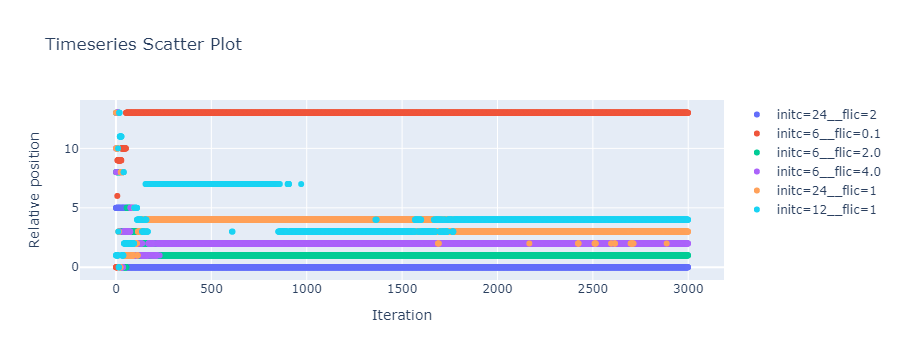

In [11]:
import plotly.graph_objects as go

fig = go.Figure()

for col in cols_to_vis:
    fig.add_trace(go.Scatter(
        x = df_sort.index,
        y = df_sort[col],
        mode = 'markers',
        name = col
    ))

fig.update_layout(
    title = 'Timeseries Scatter Plot',
    xaxis_title = 'Iteration',
    yaxis_title = 'Relative position',
)

fig.show()

In [ ]:
# df.iloc[-1].sort_values()